In [1]:
import pandas as pd  # Veri analizi için veri manipülasyonları ve yapıları sağlar. (Özellikle DataFrame)
import numpy as np  # Matematiksel işlemler ve sayısal hesaplamalar için kullanılır, genellikle dizilerle çalışır.
import matplotlib.pyplot as plt  # Veri görselleştirmesi için grafikler oluşturmak amacıyla kullanılır.
import seaborn as sns  # Daha güzel ve kolay görselleştirme yapabilmek için matplotlib'in üzerine inşa edilmiş bir kütüphane.
import ydata_profiling  # Veri profil raporları oluşturmak için kullanılır, veri hakkında özet istatistikler sağlar.
from sklearn import preprocessing  # Veriyi ön işlemek için, özellikle özellik ölçeklendirme ve dönüştürme işlemleri yapar.
from sklearn.utils import resample  # Veri dengesizliklerini dengelemek için kullanılan bir araç (over-sampling ve under-sampling).
import scipy.stats as stats  # İstatistiksel analizler ve testler yapabilmek için gerekli fonksiyonlar sağlar.
from sklearn.model_selection import train_test_split  # Veriyi eğitim ve test setlerine ayırmak için kullanılır.
from sklearn.metrics import accuracy_score  # Modelin doğruluğunu ölçmek için kullanılır.
from sklearn.tree import DecisionTreeClassifier  # Karar ağaçları modelini oluşturmak için kullanılır.
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix  # Modelin performansını değerlendirmek için çeşitli metrikler.
from sklearn.ensemble import RandomForestClassifier  # Rastgele orman (ensemble) yöntemiyle sınıflandırma yapmak için kullanılır.
from sklearn.linear_model import LogisticRegression  # Lojistik regresyon modeli ile sınıflandırma için kullanılır.
from sklearn.preprocessing import OneHotEncoder  # Kategorik verileri sayısal verilere dönüştürmek için kullanılır (One Hot Encoding).


In [2]:
data_air= pd.read_csv('FlightDelay.csv')  # CSV dosyasını okuma fonksiyonu 
data_air # okumak istediğimiz dosyayı yazdırıyoruz

,Unnamed: 0,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,DEST_AIRPORT_ID,DEST,...,DEP_TIME,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY_GROUP,CANCELLED,DISTANCE
0,238177,2019-08-11,WN,WN,N206WN,4669,13871,OMA,11259,DAL,...,1027.0,8.0,1035.0,1155.0,5.0,1210,1200.0,early_arrival,0.0,586.0
1,711175,2019-08-31,YX,YX,N745YX,3502,12266,IAH,11413,DRO,...,953.0,27.0,1020.0,1119.0,7.0,1127,1126.0,early_arrival,0.0,869.0
2,190329,2019-08-09,AA,AA,N751UW,1959,11423,DSM,14107,PHX,...,1436.0,11.0,1447.0,1525.0,4.0,1536,1529.0,early_arrival,0.0,1149.0
3,638349,2019-08-28,AA,AA,N316PF,2429,13930,ORD,11298,DFW,...,1550.0,17.0,1607.0,1750.0,15.0,1818,1805.0,early_arrival,0.0,801.0
4,273475,2019-08-12,AA,AA,N837AW,678,14107,PHX,13342,MKE,...,1226.0,14.0,1240.0,1724.0,8.0,1757,1732.0,early_arrival,0.0,1460.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,58178,2019-11-03,AS,AS,N293AK,468,12892,LAX,12478,JFK,...,1508.0,24.0,1532.0,2320.0,17.0,2345,2337.0,early_arrival,0.0,2475.0
136306,410442,2019-11-19,9E,9E,N305PQ,5298,11433,DTW,11995,GSO,...,1510.0,14.0,1524.0,1637.0,6.0,1700,1643.0,early_arrival,0.0,460.0
136307,542917,2019-11-25,DL,DL,N590NW,1887,14747,SEA,12173,HNL,...,1201.0,32.0,1233.0,1547.0,4.0,1629,1551.0,early_arrival,0.0,2677.0
136308,547678,2019-11-25,AX,AX,N41104,4603,13930,ORD,13367,MLI,...,1923.0,26.0,1949.0,2018.0,2.0,2042,2020.0,early_arrival,0.0,139.0


In [4]:
data_air.profile_report() #veri kümesini analiz etmek için kullanırız

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
data_air.info()

#Veri setindeki toplam satır sayısı.
# Her sütunun veri tipi (örneğin, int64, float64, object).
# Eksik değer sayısı: Her sütundaki eksik verilerin sayısını gösterir.
# Bellek kullanımı: Veri setinin bellek üzerindeki boyutunu belirtir.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136310 entries, 0 to 136309
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         136310 non-null  int64  
 1   FL_DATE            136310 non-null  object 
 2   OP_UNIQUE_CARRIER  136310 non-null  object 
 3   OP_CARRIER         136310 non-null  object 
 4   TAIL_NUM           135986 non-null  object 
 5   OP_CARRIER_FL_NUM  136310 non-null  int64  
 6   ORIGIN_AIRPORT_ID  136310 non-null  int64  
 7   ORIGIN             136310 non-null  object 
 8   DEST_AIRPORT_ID    136310 non-null  int64  
 9   DEST               136310 non-null  object 
 10  CRS_DEP_TIME       136310 non-null  int64  
 11  DEP_TIME           134592 non-null  float64
 12  TAXI_OUT           134531 non-null  float64
 13  WHEELS_OFF         134531 non-null  float64
 14  WHEELS_ON          134465 non-null  float64
 15  TAXI_IN            134465 non-null  float64
 16  CR

In [4]:
unique_carrier  = data_air['OP_UNIQUE_CARRIER']
new_UniqueCarrier = pd.get_dummies(unique_carrier)
new_UniqueCarrier
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,9E,AA,AS,AX,B6,C5,CP,DL,EM,EV,...,NK,OH,OO,PT,QX,UA,WN,YV,YX,ZW
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
136308,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [5]:
FL_DATE= data_air['FL_DATE']
new_TailNum = pd.get_dummies(FL_DATE)
new_TailNum
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,2019-08-01,2019-08-02,2019-08-03,2019-08-04,2019-08-05,2019-08-06,2019-08-07,2019-08-08,2019-08-09,2019-08-10,...,2019-11-21,2019-11-22,2019-11-23,2019-11-24,2019-11-25,2019-11-26,2019-11-27,2019-11-28,2019-11-29,2019-11-30
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
136308,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False


In [6]:
opcarrier = data_air['OP_CARRIER']
new_Dest = pd.get_dummies(opcarrier)
new_Dest
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,9E,AA,AS,AX,B6,C5,CP,DL,EM,EV,...,NK,OH,OO,PT,QX,UA,WN,YV,YX,ZW
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
136308,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [7]:
TAIL_NUM  = data_air['TAIL_NUM']
new_TAIL_NUM = pd.get_dummies(TAIL_NUM)
new_TAIL_NUM 
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,215NV,216NV,217NV,218NV,219NV,220NV,221NV,222NV,223NV,224NV,...,N997DL,N997JL,N997NN,N998AN,N998AT,N998DL,N998JE,N998NN,N999DN,N999JQ
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136308,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [8]:
ORIGIN  = data_air['ORIGIN']
new_ORIGIN = pd.get_dummies(ORIGIN)
new_ORIGIN 
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,ABE,ABI,ABQ,ABR,ABY,ACK,ACT,ACV,ACY,ADK,...,VEL,VLD,VPS,WRG,WYS,XNA,XWA,YAK,YKM,YUM
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136308,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
DEST = data_air['DEST']
new_Dest = pd.get_dummies(DEST)
new_Dest
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,ABE,ABI,ABQ,ABR,ABY,ACK,ACT,ACV,ACY,ADK,...,VEL,VLD,VPS,WRG,WYS,XNA,XWA,YAK,YKM,YUM
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136305,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136306,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136307,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
136308,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [10]:


ARR_DELAY_GROUP = data_air['ARR_DELAY_GROUP']
new_ARR_DELAY_GROUP = pd.get_dummies(ARR_DELAY_GROUP)
new_ARR_DELAY_GROUP
# bu kod (one-hot encoding yöntemi ile nesne objesini saısal veri türüne dönüştürüyor )

,delayed,early_arrival,ontime
0,False,True,False
1,False,True,False
2,False,True,False
3,False,True,False
4,False,True,False
...,...,...,...
136305,False,True,False
136306,False,True,False
136307,False,True,False
136308,False,True,False


In [11]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder #LabelEncoder sınıfını içeri aktarır. Bu sınıf, kategorik verileri sayısal verilere dönüştürmek için kullanılır.

# Parça boyutunu belirlemizi sağlar
#dosyanın her seferinde 10.000 satırını işleyecek şekilde ayarlanmış bir parametredir. Bu, belleği verimli kullanarak büyük veri setlerini işlemeyi sağlar.
chunksize = 10000  

# Dosya başlıklarını yazacak şekilde dosyayı oluştur
#Processed_FlightDelay.csv dosyasını yazma modunda açar. Bu dosya işlenmiş verilerin kaydedileceği yerdir.
with open('Processed_FlightDelay.csv', 'w') as f:
    pd.read_csv('FlightDelay.csv', nrows=0).to_csv(f, index=False)
    #dosyasından yalnızca başlıkları (ilk satır) okuyarak, bu başlıkları Processed_FlightDelay.csv dosyasına yazar. nrows=0 sadece başlıkları almak için kullanılır.
    

# Parçaları işlemek için fonksiyon
def process_chunk(chunk):
    # Tarih sütununu ayır
    chunk['Year'] = pd.to_datetime(chunk['FL_DATE']).dt.year
    chunk['Month'] = pd.to_datetime(chunk['FL_DATE']).dt.month
    chunk['Day'] = pd.to_datetime(chunk['FL_DATE']).dt.day
    
# LabelEncoder(): Bu sınıf, kategorik verileri sayısal verilere dönüştürür.
# fit_transform(): Kategorik verilerin her bir benzersiz değeri bir sayıya dönüştürür.
# TAIL_NUM, ORIGIN, ve DEST sütunları üzerindeki benzersiz değerleri sayılara dönüştürür.
    label_encoder = LabelEncoder()
    chunk['TAIL_NUM'] = label_encoder.fit_transform(chunk['TAIL_NUM'])
    chunk['ORIGIN'] = label_encoder.fit_transform(chunk['ORIGIN'])
    chunk['DEST'] = label_encoder.fit_transform(chunk['DEST'])

    # Kategorik sütunları One Hot Encoding ile işle
    new_UniqueCarrier = pd.get_dummies(chunk['OP_UNIQUE_CARRIER'], prefix='UniqueCarrier').astype(int)
    new_FL_DATE = pd.get_dummies(chunk['FL_DATE'], prefix='FL_DATE').astype(int)
    new_ARR_DELAY_GROUP = pd.get_dummies(chunk['ARR_DELAY_GROUP'], prefix='ARR_DELAY_GROUP').astype(int)
    new_OP_CARRIER = pd.get_dummies(chunk['OP_CARRIER'], prefix='OP_CARRIER').astype(int)
    new_TAIL_NUM = pd.get_dummies(chunk['TAIL_NUM'], prefix='TAIL_NUM').astype(int)
    new_ORIGIN = pd.get_dummies(chunk['ORIGIN'], prefix='ORIGIN').astype(int)
    new_DEST = pd.get_dummies(chunk['DEST'], prefix='DEST').astype(int)

    # One Hot Encoding yapılmış verileri birleştir
    combined_data = pd.concat(
        [new_UniqueCarrier, new_FL_DATE, new_ARR_DELAY_GROUP, new_OP_CARRIER, new_TAIL_NUM, new_ORIGIN, new_DEST], 
        axis=1
    )

    # Ana verilerle birleştir
    chunk_cleaned = chunk.drop(columns=['FL_DATE', 'OP_UNIQUE_CARRIER', 'ARR_DELAY_GROUP', 'TAIL_NUM', 'ORIGIN', 'DEST'])
    final_chunk = pd.concat([chunk_cleaned, combined_data], axis=1)

    # İşlenmiş parçayı dosyaya ekle
    final_chunk.to_csv('Processed_FlightDelay.csv', mode='a', header=False, index=False)

# Parçaları işle
for chunk in pd.read_csv('FlightDelay.csv', chunksize=chunksize):
    process_chunk(chunk)

print("Veri işleme tamamlandı!")


Veri işleme tamamlandı!


In [12]:
processed_data = pd.read_csv('Processed_FlightDelay.csv', on_bad_lines='skip')
processed_data

Unnamed: 0  \
238177 WN 4669 13871 11259 1020 1027.0 8.0  1035.0 1155.0 5.0  1210 1200.0 0.0 586.0  2019 8  11 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [15]:
import pandas as pd

# CSV dosyasını okuyun (hataları atlamak için güvenli yükleme yapıyoruz)
processed_data = pd.read_csv('Processed_FlightDelay.csv', on_bad_lines='skip')

# Eksik değerlere sahip sütunları kaldırma
processed_data = processed_data.dropna(axis=1, how='any')

# 'CANCELLED' sütununu manuel olarak kaldırma (eğer hala mevcutsa)
if 'CANCELLED' in processed_data.columns:
    processed_data = processed_data.drop(columns=['CANCELLED'])

# Güncellenmiş veri setini kontrol edin
print(processed_data.info())

# Temizlenmiş veri setini yeni bir dosyaya kaydedebilirsiniz (isteğe bağlı)
processed_data.to_csv('Cleaned_FlightDelay.csv', index=False)


<class 'pandas.core.frame.DataFrame'>
MultiIndex: 66310 entries, (238177, 'WN', 4669, 13871, 11259, 1020, 1027.0, 8.0, 1035.0, 1155.0, 5.0, 1210, 1200.0, 0.0, 586.0, 2019, 8, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

#  Veri Ön İşleme (Preprocessing) ve Veri Görselleştirme (EDA)

In [2]:
# 1. Veri Ön İşleme ve Görselleştirme
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Veriyi yükle
processed_data = pd.read_csv('Cleaned_FlightDelay.csv')

# Eksik veriler kontrol ediliyor
print(processed_data.isnull().sum())

# Hedef değişkenin dağılımını görselleştirme
sns.countplot(x='ARR_DELAY_GROUP', data=data)
plt.title('Hedef Değişken Dağılımı')
plt.show()

# Confusion Matrix'i görselleştirme
# fonksiyonu, modelin tahminleri ile gerçek değerler arasındaki karşılaştırmayı yaparak bir karmaşıklık matrisi oluşturur. 
# y_test test verisinin gerçek değerlerini, y_pred ise modelin tahmin ettiği değerleri temsil eder.
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('Confusion Matrix')
plt.show()


EmptyDataError: No columns to parse from file

#  Eğitim ve test verilerine ayır




In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)   


# Model Oluşturma ve Eğitme

In [96]:
# Modeli oluştur
# Rastgele Orman (Random Forest) sınıflandırıcı modelidir. Random Forest, birden fazla karar ağacının birleşiminden oluşan bir makine öğrenmesi algoritmasıdır. 
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
# n_estimators bu ağaç sayısını ifade eder 

# Modeli eğit
model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', random_state=42)

# Test Verisi ile Tahmin Yapma

In [97]:
# Test verisi ile tahmin yap
y_pred = model.predict(X_test)


# Performans Metrikleri Hesaplama fonksiyonları

In [100]:
# Performans metriklerini yazdır
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(f"Precision: {precision_score(y_test, y_pred, average='weighted')}")
print(f"Recall: {recall_score(y_test, y_pred, average='weighted')}")
print(f"F1 Score: {f1_score(y_test, y_pred, average='weighted')}")
print(f"Confusion Matrix:\n{confusion_matrix(y_test, y_pred)}")

# Regresyon metrikleri 
try:
    r2 = r2_score(y_test, y_pred)
    print(f"R2: {r2}")
except Exception as e:
    print(f"R2 hesaplanamadı: {e}")

# MSE, MAE, RMSE
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")


Accuracy: 0.9855843298364023
Precision: 0.9862526509847206
Recall: 0.9855843298364023
F1 Score: 0.9856807581716808
Confusion Matrix:
[[18785   393]
 [    0  8084]]
R2: 0.9308932220651767
MSE: 0.014415670163597682
MAE: 0.014415670163597682
RMSE: 0.12006527459510381


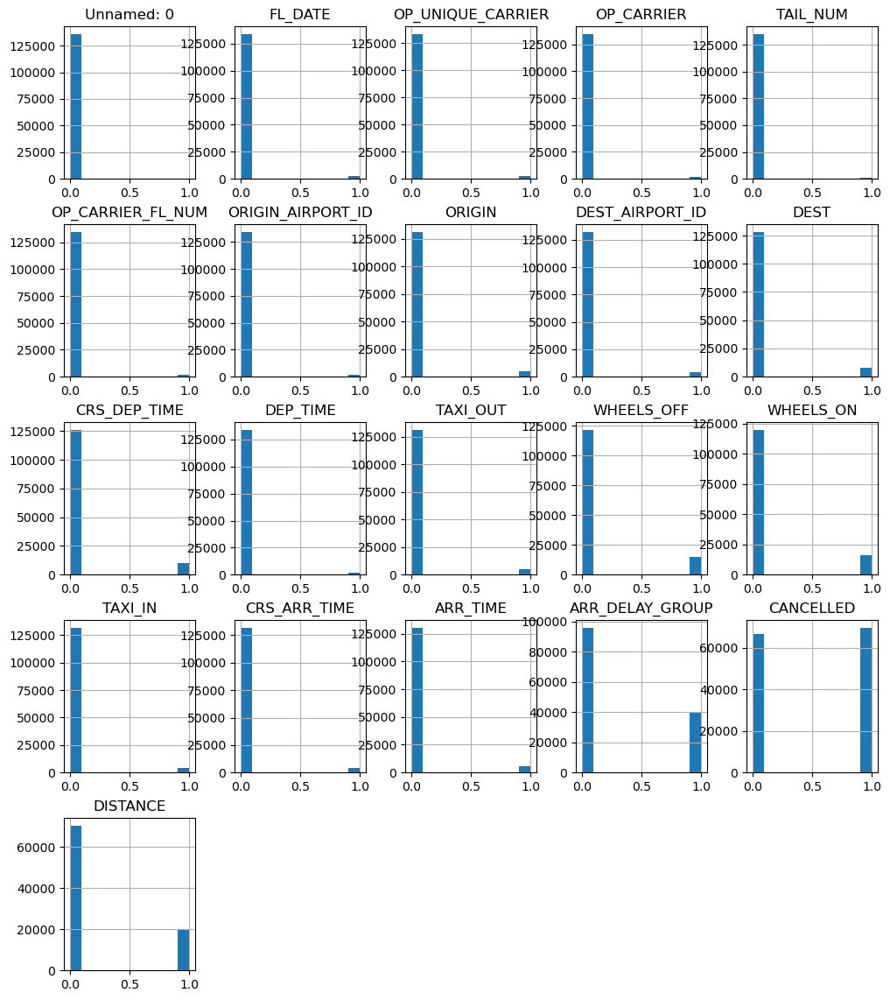

In [101]:
# Veri dağılımını görselleştirmek için bazı özelliklerin histogramlarını çizelim
processed_data.hist(figsize=(12, 14))
plt.show()

# Veri Seti Kalitesi ve Çeşitliliği:

In [102]:
from sklearn.model_selection import train_test_split

# Bağımsız değişkenler ve hedef değişkeni belirleyelim
X = processed_data.drop(columns=['ARR_DELAY_GROUP'])
y = processed_data['ARR_DELAY_GROUP']

# Eğitim, doğrulama ve test verisini oluşturma (train/test split)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# Eğitim, doğrulama ve test veri setlerinin boyutları
print(f"Eğitim Seti Boyutu: {X_train.shape[0]}")
print(f"Doğrulama Seti Boyutu: {X_val.shape[0]}")
print(f"Test Seti Boyutu: {X_test.shape[0]}")

# Sınıf dağılımı
class_distribution = y.value_counts(normalize=True)
print("Sınıf Dağılımı:")
print(class_distribution)


Eğitim Seti Boyutu: 95417
Doğrulama Seti Boyutu: 20446
Test Seti Boyutu: 20447
Sınıf Dağılımı:
ARR_DELAY_GROUP
0    0.703984
1    0.296016
Name: proportion, dtype: float64


Test Accuracy: 0.9855843298364023
Cross-validation Scores: [0.98500688 0.98496103 0.98381476 0.98468522 0.98441011]
Average CV Score: 0.9845755992235453
Train Accuracy: 0.9845755997358961
Aşırı uyum belirtisi yok.


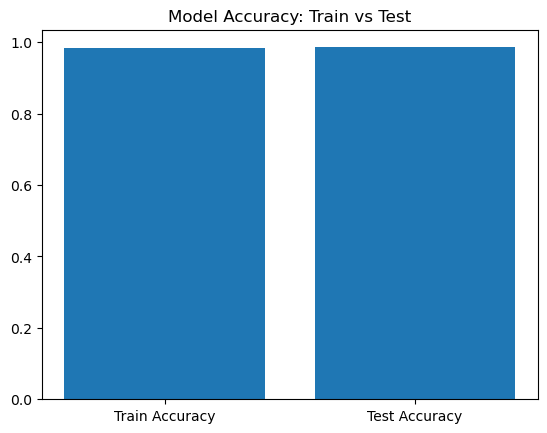

In [103]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Modeli oluştur
model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

# Eğitim ve test verilerine ayır
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Eğitim verisi üzerinde eğitim yap
model.fit(X_train, y_train)

# Test verisi üzerinde tahmin yap
y_pred = model.predict(X_test)

# Test verisi üzerindeki doğruluğu hesapla
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy}")

# Cross-validation kullanarak doğrulama yapalım
cv_scores = cross_val_score(model, X_train, y_train, cv=5)  # 5 katlı çapraz doğrulama
print(f"Cross-validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

# Overfitting kontrolü: Eğer cross-validation skoru çok daha düşükse, overfitting olabilir

# Eğitim setindeki doğruluğu hesaplayalım (overfitting için kontrol)
train_accuracy = accuracy_score(y_train, model.predict(X_train))
print(f"Train Accuracy: {train_accuracy}")

# Eğitim ve test doğruluğunu karşılaştıralım
if train_accuracy > test_accuracy:
    print("Uyarı: Aşırı Uyum tespit edildi. Model, görülmemiş verilerde daha kötü performans gösterebilir.")
else:
    print("Aşırı uyum belirtisi yok.")

# Modelin doğruluklarını görselleştir
plt.bar(['Train Accuracy', 'Test Accuracy'], [train_accuracy, test_accuracy])
plt.title('Model Accuracy: Train vs Test')
plt.show()


# Özellik Önem Derecelerini Görselleştirme

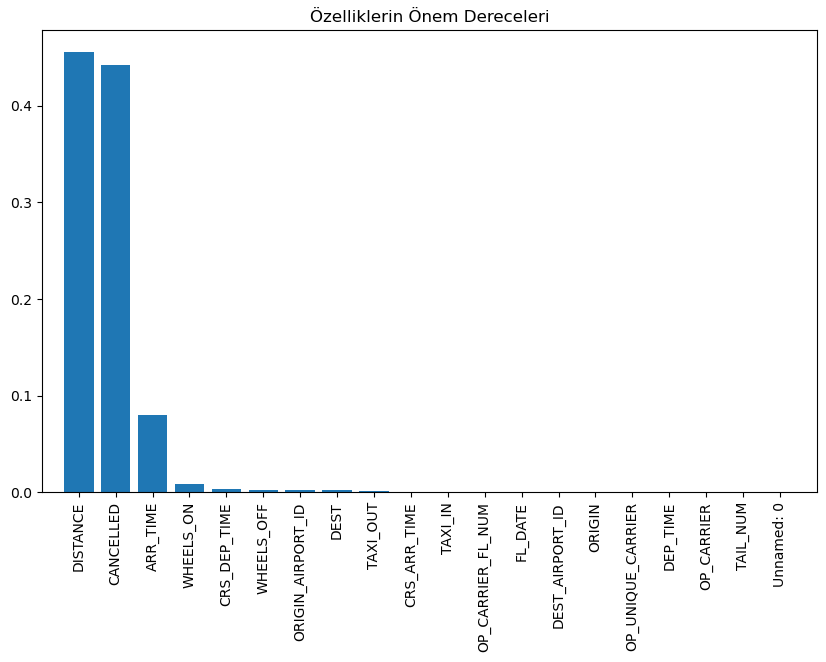

In [104]:
# Özelliklerin önem derecelerini görselleştirme
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title('Özelliklerin Önem Dereceleri')
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()


In [105]:
# NaN değerlerini kontrol ediyoruz
print(X_train.isnull().sum())

# Eksik değerleri kaldırıyoruz
X_train = X_train.dropna()
y_train = y_train.dropna()


Unnamed: 0               0
FL_DATE                  0
OP_UNIQUE_CARRIER        0
OP_CARRIER               0
TAIL_NUM                 0
OP_CARRIER_FL_NUM        0
ORIGIN_AIRPORT_ID        0
ORIGIN                   0
DEST_AIRPORT_ID          0
DEST                     0
CRS_DEP_TIME             0
DEP_TIME                 0
TAXI_OUT                 0
WHEELS_OFF               0
WHEELS_ON                0
TAXI_IN                  0
CRS_ARR_TIME             0
ARR_TIME                 0
CANCELLED                0
DISTANCE             37119
dtype: int64


# Hiperparametre Ayarı

In [106]:
# 5. Hiperparametre Ayarı
from sklearn.model_selection import GridSearchCV

# Parametre ızgarasını tanımlıyoruz, burada farklı hiperparametre değerlerini deneyeceğiz
param_grid = {
    'n_estimators': [100, 150, 200],  # Ormandaki ağaç sayısı
    'max_depth': [10, 20, None],  # Ağaçların derinliği
    'min_samples_split': [2, 5, 10],  # Ayrılmak için gereken minimum örnek sayısı
    'min_samples_leaf': [1, 2, 4],  # Yaprağın sahip olması gereken minimum örnek sayısı
}

# GridSearchCV ile hiperparametre araması başlatıyoruz
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-2, verbose=2)

# Modeli eğitim verileri ile eğitiyoruz
grid_search.fit(X_train_scaled, y_train)

# En iyi parametreleri yazdırıyoruz
print(f"En İyi Parametreler: {grid_search.best_params_}")

# En iyi parametrelerle eğitilen modeli alıyoruz
best_model = grid_search.best_estimator_

# Test verisi üzerinde tahmin yapıyoruz
y_pred_best = best_model.predict(X_test_scaled)

# En iyi modelin doğruluk oranını yazdırıyoruz
print(f"En İyi Model Accuracy: {accuracy_score(y_test, y_pred_best)}")


Fitting 3 folds for each of 81 candidates, totalling 243 fits
En İyi Parametreler: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
En İyi Model Accuracy: 0.9855843298364023


In [107]:
# 6. Yazılım Mimarisi ve Kod Kalitesi

# Veriyi yüklemek için bir fonksiyon
def load_data(file_path):
    # Veriyi belirtilen dosya yolundan okur ve bir DataFrame döner
    return pd.read_csv(file_path)

# Veriyi ön işlemek için fonksiyon
def preprocess_data(data):
    # StandardScaler kullanarak verileri ölçeklendiriyoruz
    scaler = StandardScaler()
    # Özellikler ve hedef değişkeni ayırıyoruz
    X = data.drop(columns=['ARR_DELAY_GROUP'])  # Hedef değişken hariç tüm sütunlar
    y = data['ARR_DELAY_GROUP']  # Hedef değişken
    X_scaled = scaler.fit_transform(X)  # Veriyi ölçeklendiriyoruz
    return X_scaled, y

# Modeli eğitmek için fonksiyon
def train_model(X_train, y_train):
    # Random Forest modelini oluşturuyoruz
    model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    # Modeli eğitim verileri ile eğitiyoruz
    model.fit(X_train, y_train)
    return model

# Ana fonksiyon
def main():
    # Veriyi yükle
    data = load_data('Processed_FlightDelay.csv')
    
    # Veriyi işleyerek özellikler ve hedefi ayır
    X, y = preprocess_data(data)
    
    # Veriyi eğitim ve test setlerine ayır
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Modeli eğit
    model = train_model(X_train, y_train)
    
    # Test seti ile tahmin yap
    y_pred = model.predict(X_test)
    
    # Doğruluğu yazdır
    print(f"Doğruluk (Accuracy): {accuracy_score(y_test, y_pred)}")

# Ana fonksiyonu çalıştırıyoruz, script olarak çalıştırıldığında çağrılır
if __name__ == '__main__':
    main()


Doğruluk (Accuracy): 0.9855843298364023
